# Before you start :
   - These exercises are related to the Pivot table and correlation lessons.
   - Keep in mind that you need to use some of the functions you learned in the previous lessons.
   - Elaborate your codes and outputs as much as you can.
   - Try your best to answer the questions and complete the tasks and most importantly enjoy the process!!!
  
#### Import all the necessary libraries here:


In [2]:
# Libraries
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import seaborn as sns

# Challenge 1

#### Read the `employees` dataset
Save your data in a variable called `employees`.

In [3]:
employees = pd.read_csv('./data/Employee.csv')
employees.head()

,Name,Department,Education,Gender,Title,Years,Salary
0,Jose,IT,Bachelor,M,analyst,1,35
1,Maria,IT,Master,F,analyst,2,30
2,David,HR,Master,M,analyst,2,30
3,Sonia,HR,Bachelor,F,analyst,4,35
4,Samuel,Sales,Master,M,associate,3,55


#### What's the mean `Salary` by `Department`?
**Tip**: There are 2 ways to do it: with or without pivot tables. Do it both ways. 

In [25]:
# Method 1: GroupBy
employees.groupby('Department')['Salary'].mean()

Department
HR       45.00
IT       48.75
Sales    55.00
Name: Salary, dtype: float64

In [26]:
# Method 2: Pivot_Table (mean is aggregation function by default)
employees.pivot_table(index=['Department'], values = ['Salary'])

,Salary
Department,
HR,45.00
IT,48.75
Sales,55.00


#### Now, group the data by more than one column. Use Pandas pivot table function to select the mean `Salary` by `Department` and `Title`.

In [27]:
employees.pivot_table(index = ['Department'], columns = ['Title'], values = ['Salary'], fill_value='-')

Salary                  
Title          VP analyst associate
Department                         
HR           70.0    32.5         -
IT           70.0    32.5      60.0
Sales           -       -      55.0

#### Display the number of `Years` of work experience and the `Salary` for each `Title`. Add `Years` as a column in your pivot table.
**Hint**: Use Pandas documentation to explore the [pivot table](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.pivot_table.html) function.

In [28]:
employees.pivot_table(index = ['Title'], columns = ['Years'], values = ['Salary'], fill_value='-')

Salary                              
Years          1     2     3     4     7     8
Title                                         
VP             -     -     -     -     -  70.0
analyst     35.0  30.0     -  35.0     -     -
associate      -  55.0  55.0     -  60.0     -

#### Find the mean `Salary` and number of employees in each `Department` and for each job `Title`.

In [29]:
employees.pivot_table(index = ['Department', 'Title'], values = ['Salary', 'Name'], aggfunc = {'Salary': np.mean, 'Name': 'count'})

Name  Salary
Department Title                  
HR         VP            1    70.0
           analyst       2    32.5
IT         VP            1    70.0
           analyst       2    32.5
           associate     1    60.0
Sales      associate     2    55.0

#### For each `Department` and each job `Title`, find the `Salary` median, minimum, maximum and standard deviation. Comment your results.

In [58]:
pvt = employees.pivot_table(index = ['Department', 'Title'], values = ['Salary'], aggfunc=['median', 'min', 'max', 'std'], fill_value='-').round(1)
pvt

median    min    max    std
                     Salary Salary Salary Salary
Department Title                                
HR         VP          70.0     70     70    NaN
           analyst     32.5     30     35    3.5
IT         VP          70.0     70     70    NaN
           analyst     32.5     30     35    3.5
           associate   60.0     60     60    NaN
Sales      associate   55.0     55     55    0.0

In [ ]:
"""
VPs have the same salary whatever the Department.
Associates in IT are more paid than in Sales (in this sample).
Analysts have the same salary range and mean whatever the Departement.
We have NaN for lines with a single employee.
"""

#### Based on your comments, fill the missing values with an appropriate value.

In [61]:
pvt.fillna('-')
# pvt has not changed (would require to declare inplace = True)

median    min    max    std
                     Salary Salary Salary Salary
Department Title                                
HR         VP          70.0     70     70      -
           analyst     32.5     30     35    3.5
IT         VP          70.0     70     70      -
           analyst     32.5     30     35    3.5
           associate   60.0     60     60      -
Sales      associate   55.0     55     55    0.0

#### The stake holders want to know, for each `Department`, the number of employees and how much money is spent on salaries. Could you provide that information? 

In [62]:
employees.pivot_table(index = ['Department'], values = ['Salary', 'Name'], aggfunc = {'Salary': np.sum, 'Name': 'count'})

,Name,Salary
Department,,
HR,3,135
IT,4,195
Sales,2,110


#### For each `Department` and `Title`, find the the total years of work experience and the mean `Salary`.

In [63]:
employees.pivot_table(index = ['Department', 'Title'], values = ['Salary', 'Years'], aggfunc = {'Salary': np.mean, 'Years': np.sum})

Salary  Years
Department Title                   
HR         VP           70.0      8
           analyst      32.5      6
IT         VP           70.0      8
           analyst      32.5      3
           associate    60.0      7
Sales      associate    55.0      5

## Bonus Challenge 1

#### Compute the mean `Salary` after removing the maximum `Salary` for each `Department`. Create the appropriate pivot table.
**Hint**: Write a custom function.

In [6]:
def get_maxval_group(df, group, value):
    group_max_values = df.groupby(group)[value].max()
    l_index = []
    for g in group_max_values.index:
        l_index.extend(df[(df[group] == g) & (df[value] == group_max_values[g])].index)
    return l_index

employees_womaxsals = employees.drop(get_maxval_group(employees, 'Department', 'Salary'))

employees_womaxsals.pivot_table(index = ['Department'], values = ['Salary']).round(1)

,Salary
Department,
HR,32.5
IT,41.7


# Challenge 2

#### Read the `fitbit` dataset 
Save your data in a variable called `fitbit`.

In [64]:
fitbit = pd.read_csv('./data/Fitbit.csv')
fitbit.head()

,Date,Calorie burned,Steps,Distance,Floors,Minutes Sedentary,Minutes Lightly Active,Minutes Fairly Active,Minutes Very Active,Activity Calories,MinutesOfSleep,MinutesOfBeingAwake,NumberOfAwakings,LengthOfRestInMinutes
0,08-05-2015,1934,905,0.65,0,1.355,46,0,0,1680,384,26,23,417
1,09-05-2015,3631,18925,14.11,4,611.000,316,61,60,2248,454,35,21,491
2,10-05-2015,3204,14228,10.57,1,602.000,226,14,77,1719,387,46,25,436
3,11-05-2015,2673,6756,5.02,8,749.000,190,23,4,9620,311,31,21,350
4,12-05-2015,2495,502,3.73,1,876.000,171,0,0,7360,407,65,44,491


#### Explore you dataset in terms of data types and descriptive statistics.
**Hint**: Use Pandas functions from previous lectures.

In [68]:
profile = ProfileReport(fitbit, title="Fitbit Profiling Report")
profile

Render HTML: 100%|██████████| 1/1 [00:03<00:00,  3.01s/it]


#### You suspect that there must be a linear relationship between the `Minutes Very Active` and the `Steps`. Compute the correlation between these variables.

In [69]:
fitbit['Minutes Very Active'].corr(fitbit['Steps'])

0.5714518481062608

#### Use matplotlib to visually plot `Minutes Very active` vs `Steps`. We'll work with matplotlib next week. As a first introduction, uncomment and complete the following code. You need to replace the # symbol for the correct function arguments. 

In [72]:
%matplotlib inline
import matplotlib.pyplot as plt;

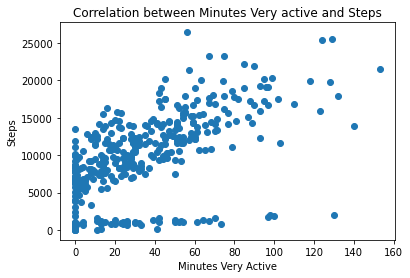

In [73]:
plt.scatter(x = 'Minutes Very Active', y = 'Steps', data = fitbit)
plt.title('Correlation between Minutes Very Active and Steps')
plt.xlabel('Minutes Very Active')
plt.ylabel('Steps')
plt.show()


#### What can you say about `Minutes Very Active` and `Steps`? Write a comment below.

In [ ]:
"""
We see that the number of Steps generally increases relatively linearly as the number of Minutes Very Active increases.
However there are some outliers, with a high number of Minutes Very Active but a number of Steps close to 0 (dataset or measurement issue?)
"""

#### We also suspect that there must be a linear relationship between the `Minutes Sedentary` and the `Steps`. Compute the correlation between these variables.

In [74]:
fitbit['Minutes Sedentary'].corr(fitbit['Steps'])

0.07690608062990092

#### Use matplotlib to visually plot `Minutes Sedentary` vs `Steps`. Based on the results of the computed correlation and the plot, what can you say about these 2 variables?

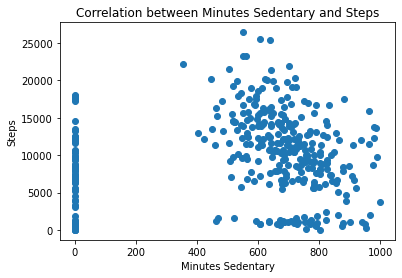

In [76]:
plt.scatter(x = 'Minutes Sedentary', y = 'Steps', data = fitbit)
plt.title('Correlation between Minutes Sedentary and Steps')
plt.xlabel('Minutes Sedentary')
plt.ylabel('Steps')
plt.show()

In [ ]:
"""
There is no significant correlation between these two variables, they are quite independent.
"""

#### We also suspect that there must be a linear relationship between the `MinutesOfSleep` and the `Steps`. Compute the correlation between these variables.

In [77]:
fitbit.MinutesOfSleep.corr(fitbit.Steps)

0.13098565950836386

#### Use matplotlib to visually plot `MinutesOfSleep` vs `Steps`. Based on the results of the computed correlation and the plot, what can you say about these 2 variables?

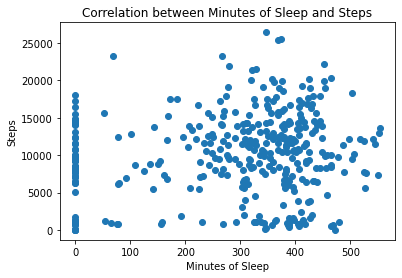

In [78]:
plt.scatter(x = 'MinutesOfSleep', y = 'Steps', data = fitbit)
plt.title('Correlation between Minutes of Sleep and Steps')
plt.xlabel('Minutes of Sleep')
plt.ylabel('Steps')
plt.show()

In [ ]:
"""
There is no significant correlation between these two variables, they are quite independent.
"""

#### Select a subset of your dataset with the columns below and compute the correlation matrix. Save the results in the variable `cor_fit`.

In [83]:
columns = ['Calorie burned', 'Steps', 'Floors', 'Minutes Sedentary', 'Minutes Very Active', 'MinutesOfSleep']
fitbit_subset = fitbit[columns]
fitbit_subset.head()

,Calorie burned,Steps,Floors,Minutes Sedentary,Minutes Very Active,MinutesOfSleep
0,1934,905,0,1.355,0,384
1,3631,18925,4,611.000,60,454
2,3204,14228,1,602.000,77,387
3,2673,6756,8,749.000,4,311
4,2495,502,1,876.000,0,407


In [84]:
fitbit_subset.corr()

,Calorie burned,Steps,Floors,Minutes Sedentary,Minutes Very Active,MinutesOfSleep
Calorie burned,1.000000,0.255305,0.130757,0.125353,0.197881,0.011485
Steps,0.255305,1.000000,0.306511,0.076906,0.571452,0.130986
Floors,0.130757,0.306511,1.000000,0.057812,0.399503,0.069464
Minutes Sedentary,0.125353,0.076906,0.057812,1.000000,0.105963,0.204242
Minutes Very Active,0.197881,0.571452,0.399503,0.105963,1.000000,0.108018
MinutesOfSleep,0.011485,0.130986,0.069464,0.204242,0.108018,1.000000


#### Based on the result of the correlation matrix, which of the features are highly correlated with variable `Steps`?
**Hint**: sort the correlations of `Steps` vs the rest of the features in descending order. You can use Pandas `sort_values`. 

In [86]:
fitbit_subset.corr()['Steps'].sort_values(ascending = False)

Steps                  1.000000
Minutes Very Active    0.571452
Floors                 0.306511
Calorie burned         0.255305
MinutesOfSleep         0.130986
Minutes Sedentary      0.076906
Name: Steps, dtype: float64

In [ ]:
"""
The only feature highly correlated with Steps is Minutes Very Active.
"""

# Challenge 3

#### Read the `time_grades` dataset from Ironhack's database:
* db: `time_grades`
* table: `time_grades`

Save your data in a variable called `time_grades`.

In [88]:
time_grades = pd.read_csv('./data/Time_Grades.csv')
time_grades.head()

,Name,Study time,Grade
0,Jose,4,4
1,Maria,9,7
2,David,8,9
3,Sonia,10,7
4,Samuel,20,9


#### Show visually the frequency distribution of the `time_grades` dataset.

<AxesSubplot:xlabel='Grade', ylabel='Count'>

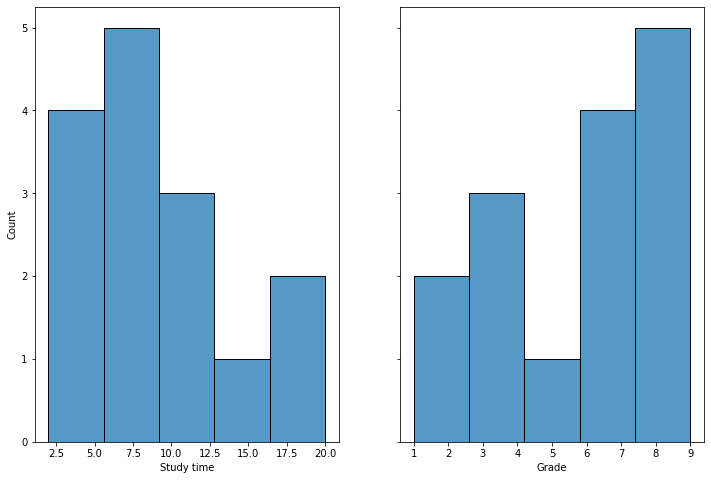

In [94]:
fig, axs = plt.subplots(1, 2, figsize = (12, 8), sharey = True)

sns.histplot(ax = axs[0], data = time_grades['Study time'])
sns.histplot(ax = axs[1], data = time_grades['Grade'])

#### Is there a correlation between `Study time` and `Grade`? Use both Pearson and Spearman correlations and comment your results.

In [103]:
print('Pearson: ') 
print(time_grades['Study time'].corr(time_grades.Grade, method = 'pearson'))

print('Spearman: ') 
print(time_grades['Study time'].corr(time_grades.Grade, method = 'spearman'))

Pearson: 
0.7980456073578857
Spearman: 
0.819658753036942


In [ ]:
"""
Both methods, despite being slightly divergent, show a high degree of correlation (about 0.8) between Study time and Grade.
The more you study, the better the grade...
"""

#### Use matplotlib to visually plot `Study time` vs `Grade`. Based on the results of the computed correlation and the plot, what can you say about these 2 variables?

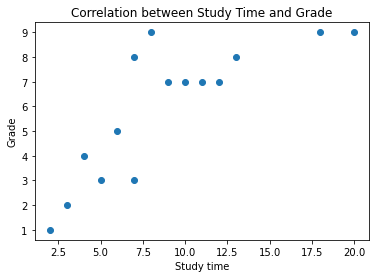

In [104]:
plt.scatter(x = 'Study time', y = 'Grade', data = time_grades)
plt.title('Correlation between Study Time and Grade')
plt.xlabel('Study time')
plt.ylabel('Grade')
plt.show()

In [ ]:
"""
The more you study, the better the grade! (in general)
"""

#### Could you explain the difference between Pearson and Spearman correlations?

In [ ]:
"""
Grade is not a continuous variables, and is not linear, so the Spearman's correlation makes more sense here.
"""